# Plot data from Hathi, etc

## Setup

In [1]:
import sys; sys.path.append('../..')
from abslithist import *
from abslithist.words import *
import mpi_slingshot as sl
p9.options.figure_size=(12,9)

In [2]:
data_dir = os.path.join(COUNT_DIR,'counts_from_jsons2','cache')
# CACHE_DF_FN = os.path.join(COUNT_DIR,'counts_from_jsons2','dfall.ft')
CACHE_DF_DATA_FN = os.path.join(COUNT_DIR,'counts_from_jsons2','dfdata.ft')
CACHE_DF_META_FN = os.path.join(COUNT_DIR,'counts_from_jsons2','dfmeta.ft')

In [3]:
CORPORA = [
#     'ARTFL',
#     'BPO',
    'CLMET',
    'COCA',
    'COHA',
    'CanonFiction',
    'Chadwyck',
    'ChadwyckDrama',
    'ChadwyckPoetry',
    'Chicago',
#     'DTA',
    'DialNarr',
    'ECCO',
#     'ECCO_LitLang',
    'ECCO_TCP',
    'EEBO_TCP',
#     'ESTC',
    'EnglishDialogues',
    'FanFic',
    'GaleAmericanFiction',
    'GildedAge',
#     'Hathi',
    'HathiBio',
    'HathiEngLit',
    'HathiEssays',
    'HathiLetters',
    'HathiNovels',
    'HathiProclamations',
    'HathiSermons',
    'HathiStories',
    'HathiTales',
    'HathiTreatises',
    'InternetArchive',
#     'JstorDFR',
#     'LitHist',
#     'LitHistAuthors',
#     'LitHistHathi',
#     'LitHistProse',
#     'LitLab',
    'MarkMark',
    'NewYorker',
    'OldBailey',
    'PMLA',
#     'RavenGarside',
    'SOTU',
    'Sellars',
#     'SemanticCohort',
    'Spectator',
    'TedJDH',
#     'txtLAB450'
]

In [4]:
# def load_path2meta(corpora=CORPORA,cols=['id','year','genre','medium','title']):
#     path2meta={}
    
#     for corpus in tqdm(corpora,desc='Loading corpus metadata files'):
# #     for corpus in corpora:
#         C=lltk.load(corpus)
#         Cdf=C.metadata
#         for col in cols:
#             if not col in set(Cdf.columns):
#                 Cdf[col]=''
#         Cdf=Cdf[cols]
# #         for rowd in tqdm(Cdf.to_dict('records'),desc=f'Loading {C.name} metadata',total=len(Cdf)):
#         found=0
#         for rowd in Cdf.to_dict('records'):
#             idx=rowd.get('id')
#             if not idx: continue
#             if not idx in C.textd: continue
#             path=C.textd[idx].path_freqs
#             if not path: continue
#             rowd['corpus']=C.name
#             path2meta[path]=rowd
#             found+=1
# #         print(corpus,found)
#     return path2meta

In [5]:
# path2meta=load_path2meta(CORPORA)
# len(path2meta)

### Load count data

In [6]:
def load_data(data_dir):
    ld=[]
    for path_meta,pathld in sl.stream_results(data_dir):
        for pdx in pathld:
            odx={**pdx, **path_meta}
            ld.append(odx)
    df=pd.DataFrame(ld)
    
    ## add essential data
    for x in ['abs','conc','neither']:
        df[f'perc_{x}'] = df[f'num_{x}']/df['num_total'] * 100
    df['abs-conc']=df['perc_abs'] - df['perc_conc']
    df['conc-abs']=df['perc_conc'] - df['perc_abs']
    df['abs/conc']=df['perc_abs'] / df['perc_conc']
    return df

In [7]:
# dfdata=load_data(data_dir)
# dfdata

### Load metadata

In [8]:
def get_metadata(df,cols=['corpus','id','year','genre','medium','title']):
    corpora_in_data = set(df.corpus)
#     print(len(corpora_in_data),list(corpora_in_data))
    allmeta=pd.DataFrame()
    iterr=tqdm(corpora_in_data,desc='Loading corresponding metadata')
    for c in iterr:
        iterr.set_description(f'Loading {c} metadata',refresh=True)
        meta=lltk.load(c).metadata
        meta['corpus']=c
        for col in cols:
            if not col in set(meta.columns):
                meta[col]=''
        allmeta = allmeta.append(meta[cols])
#         break
    allmeta['year']=pd.to_numeric(allmeta['year'],errors='coerce')
    return allmeta


In [9]:
# meta = get_metadata(dfdata)
# meta

In [10]:
# # join?
# dfall = meta.merge(dfdata,on=['corpus','id'])
# dfall

### Run setup

In [11]:
# !rm $CACHE_DF_DATA_FN
# !rm $CACHE_DF_META_FN

In [12]:
if not os.path.exists(CACHE_DF_DATA_FN) or not os.path.exists(CACHE_DF_META_FN):
    # load data
    dfdata=load_data(data_dir)

    # load meta
    dfmeta=get_metadata(dfdata)
    
    # join?
    #df = meta.merge(dfdata,on=['corpus','id'])
    
    # save
#     df.to_feather(CACHE_DF_FN)
    dfdata.reset_index().to_feather(CACHE_DF_DATA_FN)
    dfmeta.reset_index().to_feather(CACHE_DF_META_FN)
    exit()
else:
    dfdata=pd.read_feather(CACHE_DF_DATA_FN)
    dfmeta=pd.read_feather(CACHE_DF_META_FN)

dfmeta=dfmeta[~dfmeta.year.isnull()]
df=dfmeta.merge(dfdata,on=['corpus','id'])
df

,index_x,corpus,id,year,genre,medium,title,index_y,num_abs,num_conc,...,num_types,num_words,source,period,perc_abs,perc_conc,perc_neither,abs-conc,conc-abs,abs/conc
0,0,PMLA,journal/article/10.2307_41337382,1975.0,Journal,,MIDWESTERN LITERARY PERIODICALS,6158824,277,169,...,301,1847,Median,C16,42.290076,25.801527,31.908397,16.488550,-16.488550,1.639053
1,0,PMLA,journal/article/10.2307_41337382,1975.0,Journal,,MIDWESTERN LITERARY PERIODICALS,6158825,314,188,...,344,1847,Median,C17,38.861386,23.267327,37.871287,15.594059,-15.594059,1.670213
2,0,PMLA,journal/article/10.2307_41337382,1975.0,Journal,,MIDWESTERN LITERARY PERIODICALS,6158826,402,173,...,359,1847,Median,C18,47.857143,20.595238,31.547619,27.261905,-27.261905,2.323699
3,0,PMLA,journal/article/10.2307_41337382,1975.0,Journal,,MIDWESTERN LITERARY PERIODICALS,6158827,407,132,...,395,1847,Median,C19,44.432314,14.410480,41.157205,30.021834,-30.021834,3.083333
4,0,PMLA,journal/article/10.2307_41337382,1975.0,Journal,,MIDWESTERN LITERARY PERIODICALS,6158828,398,109,...,405,1847,Median,C20,41.894737,11.473684,46.631579,30.421053,-30.421053,3.651376
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9107625,116598,COHA,2000s/nf_2009_774714,2009.0,Non-Fiction,Prose,The American Civil War :a military history,7898109,238,224,...,488,2351,Median,C18,32.513661,30.601093,36.885246,1.912568,-1.912568,1.062500
9107626,116598,COHA,2000s/nf_2009_774714,2009.0,Non-Fiction,Prose,The American Civil War :a military history,7898110,270,185,...,532,2351,Median,C19,34.047919,23.329130,42.622951,10.718789,-10.718789,1.459459
9107627,116598,COHA,2000s/nf_2009_774714,2009.0,Non-Fiction,Prose,The American Civil War :a military history,7898111,303,152,...,557,2351,Median,C20,36.951220,18.536585,44.512195,18.414634,-18.414634,1.993421
9107628,116598,COHA,2000s/nf_2009_774714,2009.0,Non-Fiction,Prose,The American Civil War :a military history,7898112,303,215,...,563,2351,Median,median,36.550060,25.934861,37.515078,10.615199,-10.615199,1.409302


In [13]:
# stop

In [14]:
# Immediate filter
# df[df.year.isnull()].corpus.value_counts()
# df[~df.year.isnull()]

## Inspect

In [15]:
# df.corpus.value_counts()

In [16]:
# df.genre.value_counts()

In [17]:
# df[df.genre=='Fiction'].corpus.value_counts()

In [18]:
# df[df.genre=='Biography'].corpus.value_counts()

In [19]:
# df[df.genre=='Essays'].corpus.value_counts()

In [20]:
# df[df.genre=='Periodical'].corpus.value_counts()

In [21]:
# df[df.corpus=='EEBO_TCP']

## Categorize genres

In [22]:
def meta_genre(g):
    if g in {'Verse','Poetry'}: return 'Poetry'
    if g in {'Fiction','Novel','Tale','Story','FIC','FanFiction'}: return 'Fiction'
    if g in {'Treatise','Essay','Discourse'}: return 'Essay/Treatise/Discourse'
    if g in {'Letter','Letters'}: return 'Letters'
    if g in {'Biography'}: return g
#     if g in {'Sermon','Biography'}: return g
    return ''

In [57]:
def get_genre_from_title(
        t,
        keywords={
            'novel':'Novel',
#             'tale':'Tale',
            'romance':'Romance',
            'sermon':'Sermon',
            'essay':'Essay',
            'treatise':'Treatise',
            'discourse':'Discourse',
            'letter':'Letters'
        }):
    twords=tokenize(t,lower=True,modernize=True)
    for kw,g in keywords.items():
        if any([tw.startswith(kw) for tw in twords]):
            return g
    return ''

In [58]:
# get_genre_from_title('Ye olde romance')

In [59]:
def get_genres(row,vaguegenres={'Prose','Print','Non-Fiction'}):
    g=row.get('genre')
    
    # hack
    if row.get('corpus')=='InternetArchive': g='Fiction'
    
    t=row.get('title')
    if not g or g in vaguegenres: g=get_genre_from_title(t)
    g2=meta_genre(g)
    return (g,g2)

In [60]:
# tqdm.pandas()
genres=dfmeta.progress_apply(get_genres,axis=1)
dfmeta['genre1'],dfmeta['genre2'] = zip(*genres)
dfmeta['genres']=list(genres)
dfmeta['genrecorpus']=list(zip(dfmeta['genre1'],dfmeta['corpus']))
# genres[0]

100%|██████████| 1396815/1396815 [01:33<00:00, 14927.44it/s]


In [61]:
dfmeta[dfmeta.corpus=='EEBO_TCP'].genrecorpus.value_counts().head(20)

(, EEBO_TCP)             32915
(Verse, EEBO_TCP)         8980
(Sermon, EEBO_TCP)        4690
(Letters, EEBO_TCP)       4533
(Discourse, EEBO_TCP)     1794
(Drama, EEBO_TCP)         1713
(Treatise, EEBO_TCP)      1218
(Essay, EEBO_TCP)          340
(Novel, EEBO_TCP)          139
(Romance, EEBO_TCP)         29
Name: genrecorpus, dtype: int64

In [62]:
dfmeta['genre1'].value_counts()

Verse                     301817
Fiction                   149080
                          148826
Story                      91318
NEWS                       76805
MAG                        75670
Magazine                   61292
Poetry                     59099
Letters                    55545
Novel                      49748
SPOK                       42400
News                       41677
Tale                       34911
Treatise                   31922
Sermon                     29697
Drama                      26436
ACAD                       25230
FIC                        25082
Journal                    21832
FanFiction                 16445
Essay                      12406
Periodical                  5535
Discourse                   5511
Biography                   3716
Proclamation                1468
Fictional Narration          868
Fictional Dialogue           868
Trial                        637
Romance                      396
Film                         290
Fictional 

In [63]:
# dfmeta.genre2.value_counts()

In [64]:
# dfmeta.genres.value_counts()

In [65]:
dfmeta[dfmeta.genre2==''].genre.value_counts()

Print                     124549
NEWS                       76805
MAG                        75670
Magazine                   61292
SPOK                       42400
News                       41677
Prose                      38598
Drama                      26436
ACAD                       25230
Journal                    21832
Sermon                     12076
Periodical                  5535
Non-Fiction                 3363
Proclamation                1468
Fictional Narration          868
Fictional Dialogue           868
Trial                        637
                             333
Film                         290
Fictional Txtdialogue         91
Fictional Txtnarration        91
Oratory                       54
Other                         31
Miscellany                    20
Name: genre, dtype: int64

## Plot

In [66]:
# recombine
df=dfmeta.merge(dfdata,on=['corpus','id'])
df

,index_x,corpus,id,year,genre,medium,title,genre1,genre2,genres,...,num_types,num_words,source,period,perc_abs,perc_conc,perc_neither,abs-conc,conc-abs,abs/conc
0,0,PMLA,journal/article/10.2307_41337382,1975.0,Journal,,MIDWESTERN LITERARY PERIODICALS,Journal,,"(Journal, )",...,301,1847,Median,C16,42.290076,25.801527,31.908397,16.488550,-16.488550,1.639053
1,0,PMLA,journal/article/10.2307_41337382,1975.0,Journal,,MIDWESTERN LITERARY PERIODICALS,Journal,,"(Journal, )",...,344,1847,Median,C17,38.861386,23.267327,37.871287,15.594059,-15.594059,1.670213
2,0,PMLA,journal/article/10.2307_41337382,1975.0,Journal,,MIDWESTERN LITERARY PERIODICALS,Journal,,"(Journal, )",...,359,1847,Median,C18,47.857143,20.595238,31.547619,27.261905,-27.261905,2.323699
3,0,PMLA,journal/article/10.2307_41337382,1975.0,Journal,,MIDWESTERN LITERARY PERIODICALS,Journal,,"(Journal, )",...,395,1847,Median,C19,44.432314,14.410480,41.157205,30.021834,-30.021834,3.083333
4,0,PMLA,journal/article/10.2307_41337382,1975.0,Journal,,MIDWESTERN LITERARY PERIODICALS,Journal,,"(Journal, )",...,405,1847,Median,C20,41.894737,11.473684,46.631579,30.421053,-30.421053,3.651376
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9107625,116598,COHA,2000s/nf_2009_774714,2009.0,Non-Fiction,Prose,The American Civil War :a military history,,,"(, )",...,488,2351,Median,C18,32.513661,30.601093,36.885246,1.912568,-1.912568,1.062500
9107626,116598,COHA,2000s/nf_2009_774714,2009.0,Non-Fiction,Prose,The American Civil War :a military history,,,"(, )",...,532,2351,Median,C19,34.047919,23.329130,42.622951,10.718789,-10.718789,1.459459
9107627,116598,COHA,2000s/nf_2009_774714,2009.0,Non-Fiction,Prose,The American Civil War :a military history,,,"(, )",...,557,2351,Median,C20,36.951220,18.536585,44.512195,18.414634,-18.414634,1.993421
9107628,116598,COHA,2000s/nf_2009_774714,2009.0,Non-Fiction,Prose,The American Civil War :a military history,,,"(, )",...,563,2351,Median,median,36.550060,25.934861,37.515078,10.615199,-10.615199,1.409302


In [94]:
# Figure data
BAD_CORPORA = ['CLMET','Sellars']

# filter
df['dec']=df.year.apply(lambda y: y)#//5*5)
# df['dec']=df.year.apply(lambda y: y//5*5)
figdf=df[df.genre2!=''].groupby(['dec','genre2','genre1','corpus','period']).mean().reset_index()
figdf['genre']=figdf['genre1']
figdf['genre_corpus']=[f'{g}_{c}' for g,c in zip(figdf['genre'],figdf['corpus'])]
figdf=figdf[~figdf.corpus.isin(BAD_CORPORA)]
figdf=figdf[figdf.period!='orig']

# Custom corpus filters
figdf=figdf[(figdf.corpus!='Chadwyck') | (figdf.year<1900)]
figdf=figdf[(figdf.corpus!='MarkMark') | (figdf.year>=1900)]
figdf=figdf[(figdf.genre!='Poetry') | (figdf.corpus!='ECCO_TCP')]
figdf=figdf[(figdf.corpus!='HathiEngLit') | (figdf.year>=1720)]
figdf=figdf[figdf.year>=1520]
figdf=figdf[figdf.year<=2020]
# figdf.genre.value_counts()

In [95]:
# figdf.corpus.value_counts()

In [96]:
# figdf[figdf.genre2=='Poetry'].corpus.value_counts()

In [97]:
# figdf[figdf.genre2=='Fiction'].corpus.value_counts()

In [98]:
df.query('genre2=="Fiction" & corpus=="EEBO_TCP"').title.iloc[0]

'The conuiction of noueltie, and defense of antiquitie. Or demonstratiue arguments of the falsitie of the newe religion of England: and trueth of the Catholike Roman faith Deliuered in twelve principal sylogismes, and directed to the more scholasticall wits of the realme of great Britanie, especially to the ingenious students of the two most renowned vniuersities of Oxford &amp; Cambrige [sic]. Author R.B. Roman Catholike, and one of the English clergie and mission.'

### Figure 1

In [99]:
# fig=p9.ggplot(p9.aes(x='year',y='abs-conc',color='genre',shape='corpus'), data=figdf)
# fig+=p9.geom_point(alpha=0.25)
# fig+=p9.geom_smooth(method='loess',span=0.2)#group='genre')
# fig

### Figure 1C: By genre in column

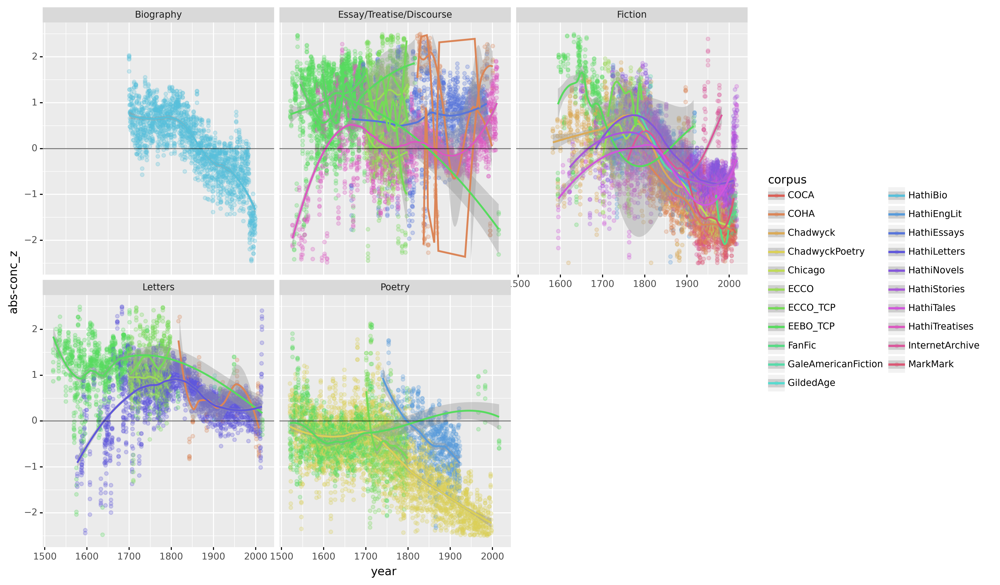

<ggplot: (8790088037781)>

In [100]:
# figdf['genre']=pd.Categorical(figdf['genre'])
# figdf['genre'].cat.reorder_categories(['Essa'])
# figdf['abs/conc']=figdf['num_abs']/figdf['num_conc']
figdf['abs-conc_z']=zscore(figdf['abs-conc'])
fig=p9.ggplot(
    p9.aes(x='year',y='abs-conc_z',color='corpus'),#,shape='period'), 
    data=figdf[figdf.genre2!='']#.groupby(['year','genre','corpus']).mean().reset_index()#[figdf.genre.isin({'Fiction'})]
)
fig+=p9.geom_point(alpha=0.25)
fig+=p9.geom_smooth(p9.aes(group='genre_corpus'),method='loess',span=0.6)#group='genre')
fig+=p9.facet_wrap('genre2')#,ncol=2,nrow=2)
# fig+=p9.ylim(-30,60)
fig+=p9.ylim(-2.5,2.5)
fig+=p9.geom_hline(yintercept=0,size=0.5,alpha=0.55)
fig

### Figure 1B
Averaging across corpora.

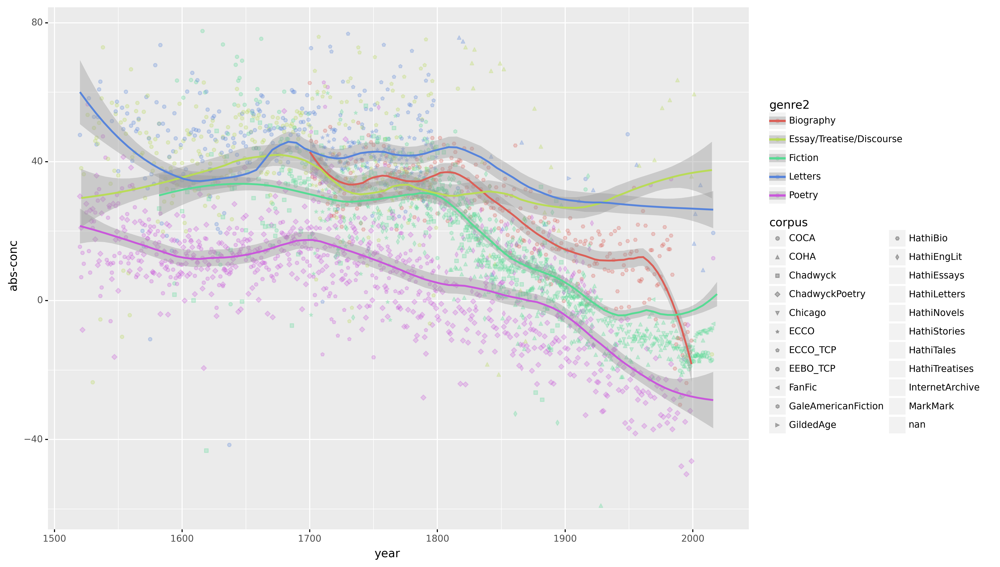

<ggplot: (8790086614905)>

In [101]:
# fig data
fig=p9.ggplot(
    p9.aes(x='year',y='abs-conc',color='genre2',shape='corpus'),
#     data=figdf.groupby(['year','genre','period']).mean().reset_index()
    data=figdf.groupby(['year','genre2','corpus']).mean().reset_index()
)
fig+=p9.geom_point(alpha=0.25)
fig+=p9.geom_smooth(p9.aes(group='genre2'),method='loess',span=0.3)#group='genre')
fig

### Figure 2

In [102]:
figdf2=figdf.melt(['year','genre1','genre2','corpus','genre_corpus','period'],['perc_abs','perc_conc','perc_neither'])
# figdf2

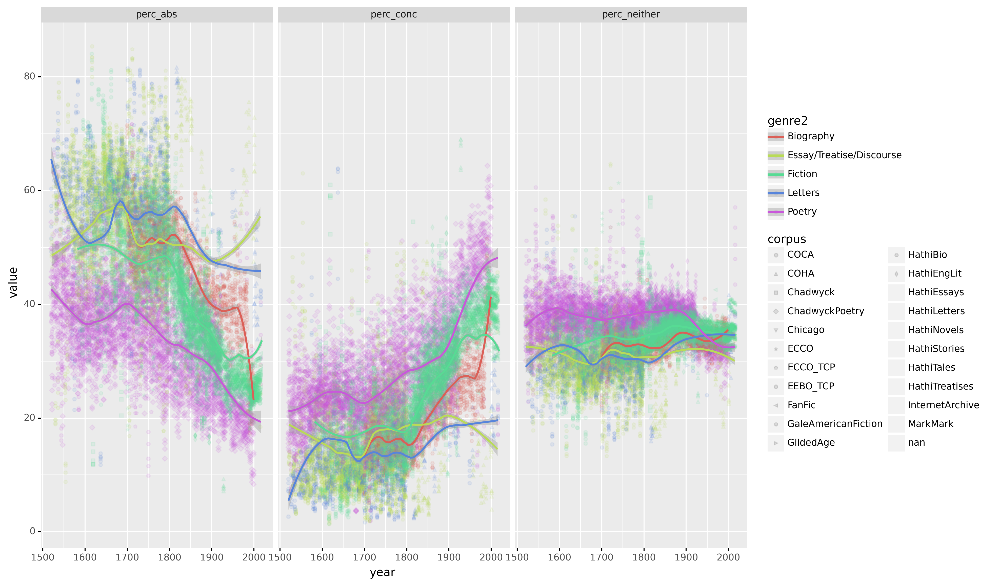

<ggplot: (8790086805069)>

In [103]:
fig=p9.ggplot(p9.aes(x='year',y='value',color='genre2',shape='corpus'), data=figdf2)
fig+=p9.geom_point(alpha=0.1)
fig+=p9.geom_smooth(p9.aes(group='genre2'),method='loess',span=0.3)#group='genre')
fig+=p9.facet_wrap('variable')
fig

In [104]:
# figdf2
figdf

,dec,genre2,genre1,corpus,period,index_x,year,index_y,num_abs,num_conc,...,num_words,perc_abs,perc_conc,perc_neither,abs-conc,conc-abs,abs/conc,genre,genre_corpus,abs-conc_z
931,1520.0,Letters,Letters,EEBO_TCP,C16,5388.0,1520.0,3445239.0,57.5,8.0,...,349.5,53.693529,8.547009,37.759463,45.146520,-45.146520,7.690476,Letters,Letters_EEBO_TCP,1.110860
932,1520.0,Letters,Letters,EEBO_TCP,C17,5388.0,1520.0,3445240.0,45.0,8.0,...,349.5,49.245283,9.245283,41.509434,40.000000,-40.000000,5.444444,Letters,Letters_EEBO_TCP,0.867360
933,1520.0,Letters,Letters,EEBO_TCP,C18,5388.0,1520.0,3445241.0,47.5,5.5,...,349.5,56.329719,7.509566,36.160714,48.820153,-48.820153,10.321429,Letters,Letters_EEBO_TCP,1.284672
934,1520.0,Letters,Letters,EEBO_TCP,C19,5388.0,1520.0,3445242.0,48.0,2.0,...,349.5,57.294254,2.649445,40.056301,54.644809,-54.644809,24.000000,Letters,Letters_EEBO_TCP,1.560256
935,1520.0,Letters,Letters,EEBO_TCP,C20,5388.0,1520.0,3445243.0,48.0,6.0,...,349.5,60.312500,7.187500,32.500000,53.125000,-53.125000,9.000000,Letters,Letters_EEBO_TCP,1.488348
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41371,2019.0,Fiction,Story,HathiStories,C17,92353.0,2019.0,338955.0,9954.0,3548.0,...,47467.0,50.035186,17.834523,32.130291,32.200664,-32.200664,2.805524,Story,Story_HathiStories,0.498348
41372,2019.0,Fiction,Story,HathiStories,C18,92353.0,2019.0,338956.0,10667.0,3621.0,...,47467.0,52.209877,17.723068,30.067055,34.486809,-34.486809,2.945871,Story,Story_HathiStories,0.606513
41373,2019.0,Fiction,Story,HathiStories,C19,92353.0,2019.0,338957.0,12212.0,3484.0,...,47467.0,55.250418,15.762566,28.987015,39.487852,-39.487852,3.505166,Story,Story_HathiStories,0.843129
41374,2019.0,Fiction,Story,HathiStories,C20,92353.0,2019.0,338958.0,14001.0,3085.0,...,47467.0,58.628198,12.918220,28.453582,45.709979,-45.709979,4.538412,Story,Story_HathiStories,1.137519


In [105]:
# fig=p9.ggplot(p9.aes(x='year',y='value',color='variable',shape='genre_corpus'), data=figdf2)
# fig+=p9.geom_point(alpha=0.1)
# fig+=p9.geom_smooth(method='loess',span=0.666)#group='genre')
# fig+=p9.facet_wrap('genre2')#,nrow=1,ncol=4)
# fig+=p9.scale_color_manual({'perc_abs':'#83b9d8', 'perc_conc':'#f9b466', 'perc_neither':'silver'})
# fig+=p9.ylim(0,70)
# fig

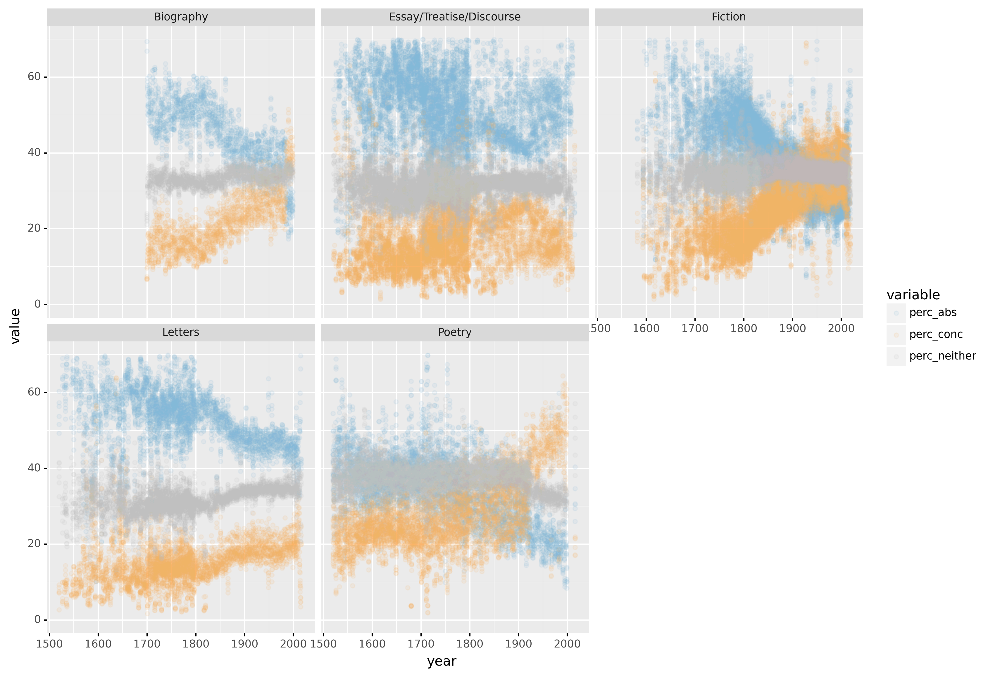

<ggplot: (8789995059309)>

In [106]:
fig=p9.ggplot(p9.aes(x='year',y='value',color='variable'), data=figdf2)
fig+=p9.geom_point(alpha=0.1)
# fig+=p9.geom_smooth(method='loess',span=0.666)#group='genre')
fig+=p9.facet_wrap('genre2')#,nrow=1,ncol=4)
fig+=p9.scale_color_manual({'perc_abs':'#83b9d8', 'perc_conc':'#f9b466', 'perc_neither':'silver'})
fig+=p9.ylim(0,70)
fig

In [107]:
# figdf.groupby(['year','genre1']).size().unstack().plot(kind='bar')

In [108]:
figdf.groupby(['genre2','genre1']).size().unstack

<bound method Series.unstack of genre2                    genre1    
Biography                 Biography     1788
Essay/Treatise/Discourse  Discourse     1614
                          Essay         2706
                          Treatise      4188
Fiction                   FIC            156
                          FanFiction     108
                          Fiction       6414
                          Novel         2520
                          Story         1596
                          Tale          1698
Letters                   Letters       4212
Poetry                    Poetry         690
                          Verse         4500
dtype: int64>